# CartPole!

In [12]:
!pip install gym stable_baselines3 moviepy gymnasium[classic-control]

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.0/14.0 MB 46.1 MB/s eta 0:00:00a 0:00:01


In [1]:
import time

import gym
from gym import wrappers
from gym.wrappers.monitoring.video_recorder import VideoRecorder
from stable_baselines3 import PPO
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.logger import configure
from stable_baselines3.common.utils import set_random_seed
from stable_baselines3.common.vec_env import DummyVecEnv
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from stable_baselines3.common.callbacks import BaseCallback
from tqdm import tqdm
from IPython.display import Video

2024-12-08 19:21:15.674135: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-08 19:21:15.692443: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1733707275.709773 1214029 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1733707275.714488 1214029 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-08 19:21:15.729515: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

## Utilities

In [2]:
class LogStepsCallback(BaseCallback):
    def __init__(self, log_dir, verbose=0):
        self.log_dir = log_dir
        super(LogStepsCallback, self).__init__(verbose)

    def _on_training_start(self) -> None:
        self.results = pd.DataFrame(columns=['Reward', 'Done'])
        print("Τraining starts!")

    def _on_step(self) -> bool:
        if 'reward' in self.locals:
            keys = ['reward', 'done']
        else:
            keys = ['rewards', 'dones']
        self.results.loc[len(self.results)] = [self.locals[keys[0]][0], self.locals[keys[1]][0]]
        return True

    def _on_training_end(self) -> None:
        self.results.to_csv(self.log_dir + 'training_data.csv', index=False)
        print("Τraining ends!")


class TqdmCallback(BaseCallback):
    def __init__(self):
        super().__init__()
        self.progress_bar = None

    def _on_training_start(self):
        self.progress_bar = tqdm(total=self.locals['total_timesteps'])

    def _on_step(self):
        self.progress_bar.update(1)
        return True

    def _on_training_end(self):
        self.progress_bar.close()
        self.progress_bar = None


def save_dict_to_file(dict, path):
    f = open(path + '/hyperparameter_dict.txt', 'w')
    f.write(str(dict))
    f.close()


def calc_episode_rewards(training_data):
    # Calculate the rewards for each training episode
    episode_rewards = []
    temp_reward_sum = 0

    for step in range(training_data.shape[0]):
        reward, done = training_data.iloc[step, :]
        temp_reward_sum += reward
        if done:
            episode_rewards.append(temp_reward_sum)
            temp_reward_sum = 0

    result = pd.DataFrame(columns=['Reward'])
    result['Reward'] = episode_rewards
    return result


def learning_curve(log_dir, window=10):
    # Read data
    training_data = pd.read_csv(log_dir + 'training_data.csv', index_col=None)

    # Calculate episode rewards
    episode_rewards = calc_episode_rewards(training_data)

    # Calculate rolling window metrics
    rolling_average = episode_rewards.rolling(window=window, min_periods=window).mean().dropna()
    rolling_max = episode_rewards.rolling(window=window, min_periods=window).max().dropna()
    rolling_min = episode_rewards.rolling(window=window, min_periods=window).min().dropna()

    # Change column name
    rolling_average.columns = ['Average Reward']
    rolling_max.columns = ['Max Reward']
    rolling_min.columns = ['Min Reward']
    rolling_data = pd.concat([rolling_average, rolling_max, rolling_min], axis=1)

    # Plot
    sns.set()
    ax = sns.lineplot(data=rolling_data)
    ax.fill_between(rolling_average.index, rolling_min.iloc[:, 0], rolling_max.iloc[:, 0], alpha=0.2)
    ax.set_title('Learning Curve')
    ax.set_ylabel('Reward')
    ax.set_xlabel('Episodes')

    # Save figure
    plt.savefig(log_dir + 'learning_curve.png')

## Main

/home/mist861/.local/lib/python3.10/site-packages/stable_baselines3/common/on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(
  0%|                                                                                                 | 0/50000 [00:00<?, ?it/s]

Τraining starts!



1200it [01:59, 426.85it/s]                                                                                                     

Τraining ends!

Execution time = 122.09 second(s)


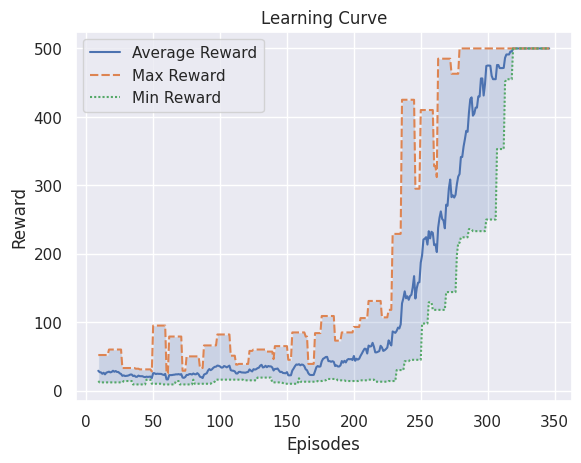

In [3]:
start = time.perf_counter()
env_id = "CartPole-v1"
seed = 0
set_random_seed(seed=seed)

# Create environment
env = make_vec_env(env_id, n_envs=1, seed=0, vec_env_cls=DummyVecEnv)

# Logging directory
model_name = 'PPO'
log_dir = 'logs/' + model_name + '_' + str(time.strftime('%d_%b_%Y_%H_%M_%S', time.localtime())) + '/'

# Agent
model_hyperparameters = {'policy': 'MlpPolicy'}
model = PPO(**model_hyperparameters, env=env, verbose=0, tensorboard_log=log_dir)
model.name = model_name

# Logger
logger = configure(log_dir, ["csv", "tensorboard"])
log_steps_callback = LogStepsCallback(log_dir=log_dir)
tqdm_callback = TqdmCallback()
model.set_logger(logger)
save_dict_to_file(model_hyperparameters, path=log_dir)  # log hyperparameters

# Learn
model.learn(total_timesteps=50_000, callback=[tqdm_callback, log_steps_callback])

# Plot learning curve
learning_curve(log_dir=log_dir)


# Execution Time
end = time.perf_counter()  # tensorboard --logdir './Classic Control/CartPole/logs'
print(f"\nExecution time = {end - start:.2f} second(s)")

## Results

In [4]:
before_training = "before_training.mp4"
video = VideoRecorder(env, before_training)
env.reset()
for i in range(200):
  env.render()
  video.capture_frame()
  action = env.action_space.sample() # Randomly sample an action, 0 (backwards) or 1 (forwards)
  observation, reward, done, info = env.step([action])
video.close()
env.close()
display(Video(before_training, embed=True, width=960, height=540))

MoviePy - Building video before_training.mp4.
MoviePy - Writing video before_training.mp4



MoviePy - Done !
MoviePy - video ready before_training.mp4


In [6]:
import os
from IPython.display import Video

mp4_video_path = './before_training.mp4'

if os.path.exists(mp4_video_path):
    display(Video(mp4_video_path, embed=True, width=960, height=540))

In [5]:
after_training = "after_training.mp4"
after_video = VideoRecorder(env, after_training)
observation = env.reset()
done = False
while not done:
  env.render()
  after_video.capture_frame()
  action, _states = model.predict(observation) # Actually get a predicted action from the model
  observation, reward, done, info = env.step(action)
after_video.close()
env.close()
# You should get a video similar to the one below. 
display(Video(after_training, embed=True, width=960, height=540))

MoviePy - Building video after_training.mp4.
MoviePy - Writing video after_training.mp4



MoviePy - Done !
MoviePy - video ready after_training.mp4


In [7]:
import os
from IPython.display import Video

mp4_video_path = './after_training.mp4'

if os.path.exists(mp4_video_path):
    display(Video(mp4_video_path, embed=True, width=960, height=540))

# Snake!

In [1]:
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Dropout
import random
import numpy as np
import pandas as pd
from operator import add
import collections

import os
import pygame
import argparse
import seaborn as sns
import matplotlib.pyplot as plt
from random import randint
from keras.utils import to_categorical
import random
import statistics

import os
from IPython.display import Video

2024-12-09 21:00:31.725502: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-09 21:00:31.733222: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1733799631.741440 3547585 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1733799631.743865 3547585 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-09 21:00:31.753505: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

pygame 2.6.1 (SDL 2.28.4, Python 3.10.12)
Hello from the pygame community. https://www.pygame.org/contribute.html


## DQN

In [2]:
class DQNAgent(object):
    def __init__(self, params):
        self.reward = 0
        self.gamma = 0.9
        self.dataframe = pd.DataFrame()
        self.short_memory = np.array([])
        self.agent_target = 1
        self.agent_predict = 0
        self.learning_rate = params['learning_rate']        
        self.epsilon = 1
        self.actual = []
        self.first_layer = params['first_layer_size']
        self.second_layer = params['second_layer_size']
        self.third_layer = params['third_layer_size']
        self.memory = collections.deque(maxlen=params['memory_size'])
        self.weights = params['weights_path']
        self.load_weights = params['load_weights']
        self.model = self.network()

    def network(self):
        model = Sequential()
        model.add(Dense(self.first_layer, activation='relu', input_dim=11))
        model.add(Dense(self.second_layer, activation='relu'))
        model.add(Dense(self.third_layer, activation='relu'))
        model.add(Dense(3, activation='softmax'))
        opt = Adam(self.learning_rate)
        model.compile(loss='mse', optimizer=opt)

        if self.load_weights:
            model.load_weights(self.weights)
        return model
    
    def get_state(self, game, player, food):
        state = [
            (player.x_change == 20 and player.y_change == 0 and ((list(map(add, player.position[-1], [20, 0])) in player.position) or
            player.position[-1][0] + 20 >= (game.game_width - 20))) or (player.x_change == -20 and player.y_change == 0 and ((list(map(add, player.position[-1], [-20, 0])) in player.position) or
            player.position[-1][0] - 20 < 20)) or (player.x_change == 0 and player.y_change == -20 and ((list(map(add, player.position[-1], [0, -20])) in player.position) or
            player.position[-1][-1] - 20 < 20)) or (player.x_change == 0 and player.y_change == 20 and ((list(map(add, player.position[-1], [0, 20])) in player.position) or
            player.position[-1][-1] + 20 >= (game.game_height-20))),  # danger straight

            (player.x_change == 0 and player.y_change == -20 and ((list(map(add,player.position[-1],[20, 0])) in player.position) or
            player.position[ -1][0] + 20 > (game.game_width-20))) or (player.x_change == 0 and player.y_change == 20 and ((list(map(add,player.position[-1],
            [-20,0])) in player.position) or player.position[-1][0] - 20 < 20)) or (player.x_change == -20 and player.y_change == 0 and ((list(map(
            add,player.position[-1],[0,-20])) in player.position) or player.position[-1][-1] - 20 < 20)) or (player.x_change == 20 and player.y_change == 0 and (
            (list(map(add,player.position[-1],[0,20])) in player.position) or player.position[-1][
             -1] + 20 >= (game.game_height-20))),  # danger right

             (player.x_change == 0 and player.y_change == 20 and ((list(map(add,player.position[-1],[20,0])) in player.position) or
             player.position[-1][0] + 20 > (game.game_width-20))) or (player.x_change == 0 and player.y_change == -20 and ((list(map(
             add, player.position[-1],[-20,0])) in player.position) or player.position[-1][0] - 20 < 20)) or (player.x_change == 20 and player.y_change == 0 and (
            (list(map(add,player.position[-1],[0,-20])) in player.position) or player.position[-1][-1] - 20 < 20)) or (
            player.x_change == -20 and player.y_change == 0 and ((list(map(add,player.position[-1],[0,20])) in player.position) or
            player.position[-1][-1] + 20 >= (game.game_height-20))), #danger left


            player.x_change == -20,  # move left
            player.x_change == 20,  # move right
            player.y_change == -20,  # move up
            player.y_change == 20,  # move down
            food.x_food < player.x,  # food left
            food.x_food > player.x,  # food right
            food.y_food < player.y,  # food up
            food.y_food > player.y  # food down
            ]

        for i in range(len(state)):
            if state[i]:
                state[i]=1
            else:
                state[i]=0

        return np.asarray(state)

    def set_reward(self, player, crash):
        self.reward = 0
        if crash:
            self.reward = -10
            return self.reward
        if player.eaten:
            self.reward = 10
        return self.reward

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay_new(self, memory, batch_size):
        if len(memory) > batch_size:
            minibatch = random.sample(memory, batch_size)
        else:
            minibatch = memory
        for state, action, reward, next_state, done in minibatch:
            target = reward
            if not done:
                target = reward + self.gamma * np.amax(self.model.predict(np.array([next_state]))[0])
            target_f = self.model.predict(np.array([state]))
            target_f[0][np.argmax(action)] = target
            self.model.fit(np.array([state]), target_f, epochs=1, verbose=0)

    def train_short_memory(self, state, action, reward, next_state, done):
        target = reward
        if not done:
            target = reward + self.gamma * np.amax(self.model.predict(next_state.reshape((1, 11)))[0])
        target_f = self.model.predict(state.reshape((1, 11)))
        target_f[0][np.argmax(action)] = target
        self.model.fit(state.reshape((1, 11)), target_f, epochs=1, verbose=0)

## Original Snake

In [ ]:
def define_parameters():
    params = dict()
    # Neural Network
    params['epsilon_decay_linear'] = 1/75
    params['learning_rate'] = 0.0005
    params['first_layer_size'] = 50   # neurons in the first layer
    params['second_layer_size'] = 300   # neurons in the second layer
    params['third_layer_size'] = 50    # neurons in the third layer
    params['episodes'] = 150           
    params['memory_size'] = 2500
    params['batch_size'] = 1000
    # Settings
    params['weights_path'] = './snake-ga-tf/weights/weights4.hdf5'
    params['load_weights'] = False
    params['train'] = True
    params['plot_score'] = True
    return params


class Game:
    def __init__(self, game_width, game_height):
        pygame.display.set_caption('SnakeGen')
        self.game_width = game_width
        self.game_height = game_height
        self.gameDisplay = pygame.display.set_mode((game_width, game_height + 60))
        self.bg = pygame.image.load("./snake-ga-tf/img/background.png")
        self.crash = False
        self.player = Player(self)
        self.food = Food()
        self.score = 0


class Player(object):
    def __init__(self, game):
        x = 0.45 * game.game_width
        y = 0.5 * game.game_height
        self.x = x - x % 20
        self.y = y - y % 20
        self.position = []
        self.position.append([self.x, self.y])
        self.food = 1
        self.eaten = False
        self.image = pygame.image.load('./snake-ga-tf/img/snakeBody.png')
        self.x_change = 20
        self.y_change = 0

    def update_position(self, x, y):
        if self.position[-1][0] != x or self.position[-1][1] != y:
            if self.food > 1:
                for i in range(0, self.food - 1):
                    self.position[i][0], self.position[i][1] = self.position[i + 1]
            self.position[-1][0] = x
            self.position[-1][1] = y

    def do_move(self, move, x, y, game, food, agent):
        move_array = [self.x_change, self.y_change]

        if self.eaten:
            self.position.append([self.x, self.y])
            self.eaten = False
            self.food = self.food + 1
        if np.array_equal(move, [1, 0, 0]):
            move_array = self.x_change, self.y_change
        elif np.array_equal(move, [0, 1, 0]) and self.y_change == 0:  # right - going horizontal
            move_array = [0, self.x_change]
        elif np.array_equal(move, [0, 1, 0]) and self.x_change == 0:  # right - going vertical
            move_array = [-self.y_change, 0]
        elif np.array_equal(move, [0, 0, 1]) and self.y_change == 0:  # left - going horizontal
            move_array = [0, -self.x_change]
        elif np.array_equal(move, [0, 0, 1]) and self.x_change == 0:  # left - going vertical
            move_array = [self.y_change, 0]
        self.x_change, self.y_change = move_array
        self.x = x + self.x_change
        self.y = y + self.y_change

        if self.x < 20 or self.x > game.game_width - 40 \
                or self.y < 20 \
                or self.y > game.game_height - 40 \
                or [self.x, self.y] in self.position:
            game.crash = True
        eat(self, food, game)

        self.update_position(self.x, self.y)

    def display_player(self, x, y, food, game):
        self.position[-1][0] = x
        self.position[-1][1] = y

        if game.crash == False:
            for i in range(food):
                x_temp, y_temp = self.position[len(self.position) - 1 - i]
                game.gameDisplay.blit(self.image, (x_temp, y_temp))

            update_screen()
        else:
            pygame.time.wait(300)


class Food(object):
    def __init__(self):
        self.x_food = 240
        self.y_food = 200
        self.image = pygame.image.load('./snake-ga-tf/img/food2.png')

    def food_coord(self, game, player):
        x_rand = randint(20, game.game_width - 40)
        self.x_food = x_rand - x_rand % 20
        y_rand = randint(20, game.game_height - 40)
        self.y_food = y_rand - y_rand % 20
        if [self.x_food, self.y_food] not in player.position:
            return self.x_food, self.y_food
        else:
            self.food_coord(game, player)

    def display_food(self, x, y, game):
        game.gameDisplay.blit(self.image, (x, y))
        update_screen()


def eat(player, food, game):
    if player.x == food.x_food and player.y == food.y_food:
        food.food_coord(game, player)
        player.eaten = True
        game.score = game.score + 1


def get_record(score, record):
    if score >= record:
        return score
    else:
        return record


def display_ui(game, score, record):
    myfont = pygame.font.SysFont('Segoe UI', 20)
    myfont_bold = pygame.font.SysFont('Segoe UI', 20, True)
    text_score = myfont.render('SCORE: ', True, (0, 0, 0))
    text_score_number = myfont.render(str(score), True, (0, 0, 0))
    text_highest = myfont.render('HIGHEST SCORE: ', True, (0, 0, 0))
    text_highest_number = myfont_bold.render(str(record), True, (0, 0, 0))
    game.gameDisplay.blit(text_score, (45, 440))
    game.gameDisplay.blit(text_score_number, (120, 440))
    game.gameDisplay.blit(text_highest, (190, 440))
    game.gameDisplay.blit(text_highest_number, (350, 440))
    game.gameDisplay.blit(game.bg, (10, 10))


def display(player, food, game, record):
    game.gameDisplay.fill((255, 255, 255))
    display_ui(game, game.score, record)
    player.display_player(player.position[-1][0], player.position[-1][1], player.food, game)
    food.display_food(food.x_food, food.y_food, game)


def update_screen():
    pygame.display.update()


def initialize_game(player, game, food, agent, batch_size):
    state_init1 = agent.get_state(game, player, food)  # [0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0]
    action = [1, 0, 0]
    player.do_move(action, player.x, player.y, game, food, agent)
    state_init2 = agent.get_state(game, player, food)
    reward1 = agent.set_reward(player, game.crash)
    agent.remember(state_init1, action, reward1, state_init2, game.crash)
    agent.replay_new(agent.memory, batch_size)


def plot_seaborn(array_counter, array_score,train):
    sns.set(color_codes=True, font_scale=1.5)
    sns.set_style("white")
    plt.figure(figsize=(13,8))
    if train==False:
        fit_reg = False
    ax = sns.regplot(
        np.array([array_counter])[0],
        np.array([array_score])[0],
        #color="#36688D",
        x_jitter=.1,
        scatter_kws={"color": "#36688D"},
        label='Data',
        fit_reg = fit_reg,
        line_kws={"color": "#F49F05"}
    )
    # Plot the average line
    y_mean = [np.mean(array_score)]*len(array_counter)
    ax.plot(array_counter,y_mean, label='Mean', linestyle='--')
    ax.legend(loc='upper right')
    ax.set(xlabel='# games', ylabel='score')
    plt.ylim(0,65)
    plt.show()


def get_mean_stdev(array):
    return statistics.mean(array), statistics.stdev(array)    


def test(display_option, speed, params):
    params['load_weights'] = True
    params['train'] = False
    score, mean, stdev = run(display_option, speed, params)
    return score, mean, stdev


def run(display_option, speed, params):
    pygame.init()
    agent = DQNAgent(params)
    weights_filepath = params['weights_path']
    if params['load_weights']:
        agent.model.load_weights(weights_filepath)
        print("weights loaded")
    counter_games = 0
    score_plot = []
    counter_plot = []
    record = 0
    total_score = 0
    while counter_games < params['episodes']:
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                pygame.quit()
                quit()
        # Initialize classes
        game = Game(440, 440)
        player1 = game.player
        food1 = game.food

        # Perform first move
        initialize_game(player1, game, food1, agent, params['batch_size'])
        if display_option:
            display(player1, food1, game, record)

        while not game.crash:
            if not params['train']:
                agent.epsilon = 0.00
            else:
                # agent.epsilon is set to give randomness to actions
                agent.epsilon = 1 - (counter_games * params['epsilon_decay_linear'])

            # get old state
            state_old = agent.get_state(game, player1, food1)

            # perform random actions based on agent.epsilon, or choose the action
            if random.uniform(0, 1) < agent.epsilon:
                final_move = to_categorical(randint(0, 2), num_classes=3)
            else:
                # predict action based on the old state
                prediction = agent.model.predict(state_old.reshape((1, 11)))
                final_move = to_categorical(np.argmax(prediction[0]), num_classes=3)

            # perform new move and get new state
            player1.do_move(final_move, player1.x, player1.y, game, food1, agent)
            state_new = agent.get_state(game, player1, food1)

            # set reward for the new state
            reward = agent.set_reward(player1, game.crash)

            if params['train']:
                # train short memory base on the new action and state
                agent.train_short_memory(state_old, final_move, reward, state_new, game.crash)
                # store the new data into a long term memory
                agent.remember(state_old, final_move, reward, state_new, game.crash)

            record = get_record(game.score, record)
            if display_option:
                display(player1, food1, game, record)
                pygame.time.wait(speed)
        if params['train']:
            agent.replay_new(agent.memory, params['batch_size'])
        counter_games += 1
        total_score += game.score
        print(f'Game {counter_games}      Score: {game.score}')
        score_plot.append(game.score)
        counter_plot.append(counter_games)
    mean, stdev = get_mean_stdev(score_plot)
    if params['train']:
        agent.model.save_weights(params['weights_path'])
        total_score, mean, stdev = test(display_option, speed, params)
    if params['plot_score']:
        plot_seaborn(counter_plot, score_plot, params['train'])
    print('Total score: {}   Mean: {}   Std dev:   {}'.format(total_score, mean, stdev))
    return total_score, mean, stdev

## Execution

In [ ]:
# Set options to activate or deactivate the game view, and its speed
pygame.font.init()
params = define_parameters()
params['bayesian_optimization'] = False    # Use bayesOpt.py for Bayesian Optimization
run(False, 0, params)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step

/home/mist861/.local/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
W0000 00:00:1733768502.473980  151030 gpu_device.cc:2344] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━

### NOTE

The above wasn't able to fully train any meaningful amount in the Jupyter notebook due to browser memory issues (for some reason).  So, because this was initially written as a Python script, I ran it manually on the command-line, saved the weights (after 25 episodes, this trains extremely slowly), and then loaded them below in the "Trained" section. The "Untrained" section demonstrates a brand-new, untrained agent.

## Snake Untrained

In [4]:
def define_parameters():
    params = dict()
    # Neural Network
    params['epsilon_decay_linear'] = 1/75
    params['learning_rate'] = 0.0005
    params['first_layer_size'] = 50   # neurons in the first layer
    params['second_layer_size'] = 300   # neurons in the second layer
    params['third_layer_size'] = 50    # neurons in the third layer
    params['episodes'] = 5           
    params['memory_size'] = 2500
    params['batch_size'] = 1000
    # Settings
    params['weights_path'] = './snake-ga-tf/weights/weights5.weights.h5'
    params['load_weights'] = False
    params['train'] = True
    params['plot_score'] = True
    return params


class Game:
    def __init__(self, game_width, game_height):
        pygame.display.set_caption('SnakeGen')
        self.game_width = game_width
        self.game_height = game_height
        self.gameDisplay = pygame.display.set_mode((game_width, game_height + 60))
        self.bg = pygame.image.load("./snake-ga-tf/img/background.png")
        self.crash = False
        self.player = Player(self)
        self.food = Food()
        self.score = 0


class Player(object):
    def __init__(self, game):
        x = 0.45 * game.game_width
        y = 0.5 * game.game_height
        self.x = x - x % 20
        self.y = y - y % 20
        self.position = []
        self.position.append([self.x, self.y])
        self.food = 1
        self.eaten = False
        self.image = pygame.image.load('./snake-ga-tf/img/snakeBody.png')
        self.x_change = 20
        self.y_change = 0

    def update_position(self, x, y):
        if self.position[-1][0] != x or self.position[-1][1] != y:
            if self.food > 1:
                for i in range(0, self.food - 1):
                    self.position[i][0], self.position[i][1] = self.position[i + 1]
            self.position[-1][0] = x
            self.position[-1][1] = y

    def do_move(self, move, x, y, game, food, agent):
        move_array = [self.x_change, self.y_change]

        if self.eaten:
            self.position.append([self.x, self.y])
            self.eaten = False
            self.food = self.food + 1
        if np.array_equal(move, [1, 0, 0]):
            move_array = self.x_change, self.y_change
        elif np.array_equal(move, [0, 1, 0]) and self.y_change == 0:  # right - going horizontal
            move_array = [0, self.x_change]
        elif np.array_equal(move, [0, 1, 0]) and self.x_change == 0:  # right - going vertical
            move_array = [-self.y_change, 0]
        elif np.array_equal(move, [0, 0, 1]) and self.y_change == 0:  # left - going horizontal
            move_array = [0, -self.x_change]
        elif np.array_equal(move, [0, 0, 1]) and self.x_change == 0:  # left - going vertical
            move_array = [self.y_change, 0]
        self.x_change, self.y_change = move_array
        self.x = x + self.x_change
        self.y = y + self.y_change

        if self.x < 20 or self.x > game.game_width - 40 \
                or self.y < 20 \
                or self.y > game.game_height - 40 \
                or [self.x, self.y] in self.position:
            game.crash = True
        eat(self, food, game)

        self.update_position(self.x, self.y)

    def display_player(self, x, y, food, game):
        self.position[-1][0] = x
        self.position[-1][1] = y

        if game.crash == False:
            for i in range(food):
                x_temp, y_temp = self.position[len(self.position) - 1 - i]
                game.gameDisplay.blit(self.image, (x_temp, y_temp))

            update_screen()
        else:
            pygame.time.wait(300)


class Food(object):
    def __init__(self):
        self.x_food = 240
        self.y_food = 200
        self.image = pygame.image.load('./snake-ga-tf/img/food2.png')

    def food_coord(self, game, player):
        x_rand = randint(20, game.game_width - 40)
        self.x_food = x_rand - x_rand % 20
        y_rand = randint(20, game.game_height - 40)
        self.y_food = y_rand - y_rand % 20
        if [self.x_food, self.y_food] not in player.position:
            return self.x_food, self.y_food
        else:
            self.food_coord(game, player)

    def display_food(self, x, y, game):
        game.gameDisplay.blit(self.image, (x, y))
        update_screen()


def eat(player, food, game):
    if player.x == food.x_food and player.y == food.y_food:
        food.food_coord(game, player)
        player.eaten = True
        game.score = game.score + 1


def get_record(score, record):
    if score >= record:
        return score
    else:
        return record


def display_ui(game, score, record):
    myfont = pygame.font.SysFont('Segoe UI', 20)
    myfont_bold = pygame.font.SysFont('Segoe UI', 20, True)
    text_score = myfont.render('SCORE: ', True, (0, 0, 0))
    text_score_number = myfont.render(str(score), True, (0, 0, 0))
    text_highest = myfont.render('HIGHEST SCORE: ', True, (0, 0, 0))
    text_highest_number = myfont_bold.render(str(record), True, (0, 0, 0))
    game.gameDisplay.blit(text_score, (45, 440))
    game.gameDisplay.blit(text_score_number, (120, 440))
    game.gameDisplay.blit(text_highest, (190, 440))
    game.gameDisplay.blit(text_highest_number, (350, 440))
    game.gameDisplay.blit(game.bg, (10, 10))


def display(player, food, game, record):
    game.gameDisplay.fill((255, 255, 255))
    display_ui(game, game.score, record)
    player.display_player(player.position[-1][0], player.position[-1][1], player.food, game)
    food.display_food(food.x_food, food.y_food, game)


def update_screen():
    pygame.display.update()


def initialize_game(player, game, food, agent, batch_size):
    state_init1 = agent.get_state(game, player, food)  # [0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0]
    action = [1, 0, 0]
    player.do_move(action, player.x, player.y, game, food, agent)
    state_init2 = agent.get_state(game, player, food)
    reward1 = agent.set_reward(player, game.crash)
    agent.remember(state_init1, action, reward1, state_init2, game.crash)
    agent.replay_new(agent.memory, batch_size)


def plot_seaborn(array_counter, array_score,train):
    sns.set(color_codes=True, font_scale=1.5)
    sns.set_style("white")
    plt.figure(figsize=(13,8))
    if train==False:
        fit_reg = False
    ax = sns.regplot(
        x=np.array([array_counter])[0],
        y=np.array([array_score])[0],
        #color="#36688D",
        x_jitter=.1,
        scatter_kws={"color": "#36688D"},
        label='Data',
        fit_reg = fit_reg,
        line_kws={"color": "#F49F05"}
    )
    # Plot the average line
    y_mean = [np.mean(array_score)]*len(array_counter)
    ax.plot(array_counter,y_mean, label='Mean', linestyle='--')
    ax.legend(loc='upper right')
    ax.set(xlabel='# games', ylabel='score')
    plt.ylim(0,10)
    plt.show()


def get_mean_stdev(array):
    return statistics.mean(array), statistics.stdev(array)    


def test(display_option, speed, params):
    params['load_weights'] = True
    params['train'] = False
    score, mean, stdev = run(display_option, speed, params)
    return score, mean, stdev


def run(display_option, speed, params):
    pygame.init()
    agent = DQNAgent(params)
    weights_filepath = params['weights_path']
    if params['load_weights']:
        agent.model.load_weights(weights_filepath)
        print("weights loaded")
    counter_games = 0
    score_plot = []
    counter_plot = []
    record = 0
    total_score = 0
    while counter_games < params['episodes']:
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                pygame.quit()
                quit()
        # Initialize classes
        game = Game(440, 440)
        player1 = game.player
        food1 = game.food

        # Perform first move
        initialize_game(player1, game, food1, agent, params['batch_size'])
        if display_option:
            display(player1, food1, game, record)

        stuck_count = 0

        while not game.crash:
            stuck_score = game.score
            if not params['train']:
                agent.epsilon = 0.00
            else:
                # agent.epsilon is set to give randomness to actions
                agent.epsilon = 1 - (counter_games * params['epsilon_decay_linear'])

            # get old state
            state_old = agent.get_state(game, player1, food1)

            # perform random actions based on agent.epsilon, or choose the action
            if random.uniform(0, 1) < agent.epsilon:
                final_move = to_categorical(randint(0, 2), num_classes=3)
            else:
                # predict action based on the old state
                prediction = agent.model.predict(state_old.reshape((1, 11)))
                final_move = to_categorical(np.argmax(prediction[0]), num_classes=3)

            # perform new move and get new state
            player1.do_move(final_move, player1.x, player1.y, game, food1, agent)
            state_new = agent.get_state(game, player1, food1)

            # set reward for the new state
            reward = agent.set_reward(player1, game.crash)

            if params['train']:
                # train short memory base on the new action and state
                agent.train_short_memory(state_old, final_move, reward, state_new, game.crash)
                # store the new data into a long term memory
                agent.remember(state_old, final_move, reward, state_new, game.crash)

            record = get_record(game.score, record)
            if display_option:
                display(player1, food1, game, record)
                pygame.time.wait(speed)
            if stuck_score == game.score:
                stuck_count = stuck_count + 1
            else:
                stuck_count = 0
            if stuck_count >= 200:
                game.crash = True
        if params['train']:
            agent.replay_new(agent.memory, params['batch_size'])
        counter_games += 1
        total_score += game.score
        print(f'Game {counter_games}      Score: {game.score}')
        score_plot.append(game.score)
        counter_plot.append(counter_games)
    mean, stdev = get_mean_stdev(score_plot)
    if params['train']:
        agent.model.save_weights(params['weights_path'])
        total_score, mean, stdev = test(display_option, speed, params)
    if params['plot_score']:
        plot_seaborn(counter_plot, score_plot, params['train'])
    print('Total score: {}   Mean: {}   Std dev:   {}'.format(total_score, mean, stdev))
    return total_score, mean, stdev

In [ ]:
# Set options to activate or deactivate the game view, and its speed
pygame.font.init()
params = define_parameters()
params['bayesian_optimization'] = False    # Use bayesOpt.py for Bayesian Optimization
run(True, 50, params)

/home/mist861/.local/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1733799404.866750 3452694 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9511 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4080 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step

I0000 00:00:1733799405.547489 3453017 service.cc:148] XLA service 0x7f7c9c004f60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733799405.547515 3453017 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 4080 Laptop GPU, Compute Capability 8.9
2024-12-09 20:56:45.552048: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1733799405.566426 3453017 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1733799405.697672 3453017 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━

In [4]:
import os
from IPython.display import Video

mp4_video_path = './snake-ga-tf/snake_untrained.mp4'

if os.path.exists(mp4_video_path):
    display(Video(mp4_video_path, embed=True, width=960, height=540))

## Snake Trained

In [3]:
def define_parameters():
    params = dict()
    # Neural Network
    params['epsilon_decay_linear'] = 1/75
    params['learning_rate'] = 0.0005
    params['first_layer_size'] = 50   # neurons in the first layer
    params['second_layer_size'] = 300   # neurons in the second layer
    params['third_layer_size'] = 50    # neurons in the third layer
    params['episodes'] = 5           
    params['memory_size'] = 2500
    params['batch_size'] = 1000
    # Settings
    params['weights_path'] = './snake-ga-tf/weights/weights4.weights.h5'
    params['load_weights'] = True
    params['train'] = False
    params['plot_score'] = True
    return params


class Game:
    def __init__(self, game_width, game_height):
        pygame.display.set_caption('SnakeGen')
        self.game_width = game_width
        self.game_height = game_height
        self.gameDisplay = pygame.display.set_mode((game_width, game_height + 60))
        self.bg = pygame.image.load("./snake-ga-tf/img/background.png")
        self.crash = False
        self.player = Player(self)
        self.food = Food()
        self.score = 0


class Player(object):
    def __init__(self, game):
        x = 0.45 * game.game_width
        y = 0.5 * game.game_height
        self.x = x - x % 20
        self.y = y - y % 20
        self.position = []
        self.position.append([self.x, self.y])
        self.food = 1
        self.eaten = False
        self.image = pygame.image.load('./snake-ga-tf/img/snakeBody.png')
        self.x_change = 20
        self.y_change = 0

    def update_position(self, x, y):
        if self.position[-1][0] != x or self.position[-1][1] != y:
            if self.food > 1:
                for i in range(0, self.food - 1):
                    self.position[i][0], self.position[i][1] = self.position[i + 1]
            self.position[-1][0] = x
            self.position[-1][1] = y

    def do_move(self, move, x, y, game, food, agent):
        move_array = [self.x_change, self.y_change]

        if self.eaten:
            self.position.append([self.x, self.y])
            self.eaten = False
            self.food = self.food + 1
        if np.array_equal(move, [1, 0, 0]):
            move_array = self.x_change, self.y_change
        elif np.array_equal(move, [0, 1, 0]) and self.y_change == 0:  # right - going horizontal
            move_array = [0, self.x_change]
        elif np.array_equal(move, [0, 1, 0]) and self.x_change == 0:  # right - going vertical
            move_array = [-self.y_change, 0]
        elif np.array_equal(move, [0, 0, 1]) and self.y_change == 0:  # left - going horizontal
            move_array = [0, -self.x_change]
        elif np.array_equal(move, [0, 0, 1]) and self.x_change == 0:  # left - going vertical
            move_array = [self.y_change, 0]
        self.x_change, self.y_change = move_array
        self.x = x + self.x_change
        self.y = y + self.y_change

        if self.x < 20 or self.x > game.game_width - 40 \
                or self.y < 20 \
                or self.y > game.game_height - 40 \
                or [self.x, self.y] in self.position:
            game.crash = True
        eat(self, food, game)

        self.update_position(self.x, self.y)

    def display_player(self, x, y, food, game):
        self.position[-1][0] = x
        self.position[-1][1] = y

        if game.crash == False:
            for i in range(food):
                x_temp, y_temp = self.position[len(self.position) - 1 - i]
                game.gameDisplay.blit(self.image, (x_temp, y_temp))

            update_screen()
        else:
            pygame.time.wait(300)


class Food(object):
    def __init__(self):
        self.x_food = 240
        self.y_food = 200
        self.image = pygame.image.load('./snake-ga-tf/img/food2.png')

    def food_coord(self, game, player):
        x_rand = randint(20, game.game_width - 40)
        self.x_food = x_rand - x_rand % 20
        y_rand = randint(20, game.game_height - 40)
        self.y_food = y_rand - y_rand % 20
        if [self.x_food, self.y_food] not in player.position:
            return self.x_food, self.y_food
        else:
            self.food_coord(game, player)

    def display_food(self, x, y, game):
        game.gameDisplay.blit(self.image, (x, y))
        update_screen()


def eat(player, food, game):
    if player.x == food.x_food and player.y == food.y_food:
        food.food_coord(game, player)
        player.eaten = True
        game.score = game.score + 1


def get_record(score, record):
    if score >= record:
        return score
    else:
        return record


def display_ui(game, score, record):
    myfont = pygame.font.SysFont('Segoe UI', 20)
    myfont_bold = pygame.font.SysFont('Segoe UI', 20, True)
    text_score = myfont.render('SCORE: ', True, (0, 0, 0))
    text_score_number = myfont.render(str(score), True, (0, 0, 0))
    text_highest = myfont.render('HIGHEST SCORE: ', True, (0, 0, 0))
    text_highest_number = myfont_bold.render(str(record), True, (0, 0, 0))
    game.gameDisplay.blit(text_score, (45, 440))
    game.gameDisplay.blit(text_score_number, (120, 440))
    game.gameDisplay.blit(text_highest, (190, 440))
    game.gameDisplay.blit(text_highest_number, (350, 440))
    game.gameDisplay.blit(game.bg, (10, 10))


def display(player, food, game, record):
    game.gameDisplay.fill((255, 255, 255))
    display_ui(game, game.score, record)
    player.display_player(player.position[-1][0], player.position[-1][1], player.food, game)
    food.display_food(food.x_food, food.y_food, game)


def update_screen():
    pygame.display.update()


def initialize_game(player, game, food, agent, batch_size):
    state_init1 = agent.get_state(game, player, food)  # [0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0]
    action = [1, 0, 0]
    player.do_move(action, player.x, player.y, game, food, agent)
    state_init2 = agent.get_state(game, player, food)
    reward1 = agent.set_reward(player, game.crash)
    agent.remember(state_init1, action, reward1, state_init2, game.crash)
    agent.replay_new(agent.memory, batch_size)


def plot_seaborn(array_counter, array_score,train):
    sns.set(color_codes=True, font_scale=1.5)
    sns.set_style("white")
    plt.figure(figsize=(13,8))
    if train==False:
        fit_reg = False
    ax = sns.regplot(
        x=np.array([array_counter])[0],
        y=np.array([array_score])[0],
        #color="#36688D",
        x_jitter=.1,
        scatter_kws={"color": "#36688D"},
        label='Data',
        fit_reg = fit_reg,
        line_kws={"color": "#F49F05"}
    )
    # Plot the average line
    y_mean = [np.mean(array_score)]*len(array_counter)
    ax.plot(array_counter,y_mean, label='Mean', linestyle='--')
    ax.legend(loc='upper right')
    ax.set(xlabel='# games', ylabel='score')
    plt.ylim(0,10)
    plt.show()


def get_mean_stdev(array):
    return statistics.mean(array), statistics.stdev(array)    


def test(display_option, speed, params):
    params['load_weights'] = True
    params['train'] = False
    score, mean, stdev = run(display_option, speed, params)
    return score, mean, stdev


def run(display_option, speed, params):
    pygame.init()
    agent = DQNAgent(params)
    weights_filepath = params['weights_path']
    if params['load_weights']:
        agent.model.load_weights(weights_filepath)
        print("weights loaded")
    counter_games = 0
    score_plot = []
    counter_plot = []
    record = 0
    total_score = 0
    while counter_games < params['episodes']:
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                pygame.quit()
                quit()
        # Initialize classes
        game = Game(440, 440)
        player1 = game.player
        food1 = game.food

        # Perform first move
        initialize_game(player1, game, food1, agent, params['batch_size'])
        if display_option:
            display(player1, food1, game, record)

        stuck_count = 0

        while not game.crash:
            stuck_score = game.score
            if not params['train']:
                agent.epsilon = 0.00
            else:
                # agent.epsilon is set to give randomness to actions
                agent.epsilon = 1 - (counter_games * params['epsilon_decay_linear'])

            # get old state
            state_old = agent.get_state(game, player1, food1)

            # perform random actions based on agent.epsilon, or choose the action
            if random.uniform(0, 1) < agent.epsilon:
                final_move = to_categorical(randint(0, 2), num_classes=3)
            else:
                # predict action based on the old state
                prediction = agent.model.predict(state_old.reshape((1, 11)))
                final_move = to_categorical(np.argmax(prediction[0]), num_classes=3)

            # perform new move and get new state
            player1.do_move(final_move, player1.x, player1.y, game, food1, agent)
            state_new = agent.get_state(game, player1, food1)

            # set reward for the new state
            reward = agent.set_reward(player1, game.crash)

            if params['train']:
                # train short memory base on the new action and state
                agent.train_short_memory(state_old, final_move, reward, state_new, game.crash)
                # store the new data into a long term memory
                agent.remember(state_old, final_move, reward, state_new, game.crash)

            record = get_record(game.score, record)
            if display_option:
                display(player1, food1, game, record)
                pygame.time.wait(speed)
            if stuck_score == game.score:
                stuck_count = stuck_count + 1
            else:
                stuck_count = 0
            if stuck_count >= 200:
                game.crash = True
        if params['train']:
            agent.replay_new(agent.memory, params['batch_size'])
        counter_games += 1
        total_score += game.score
        print(f'Game {counter_games}      Score: {game.score}')
        score_plot.append(game.score)
        counter_plot.append(counter_games)
    mean, stdev = get_mean_stdev(score_plot)
    if params['train']:
        agent.model.save_weights(params['weights_path'])
        total_score, mean, stdev = test(display_option, speed, params)
    if params['plot_score']:
        plot_seaborn(counter_plot, score_plot, params['train'])
    print('Total score: {}   Mean: {}   Std dev:   {}'.format(total_score, mean, stdev))
    return total_score, mean, stdev

/home/mist861/.local/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1733798930.557998 3376214 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9511 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4080 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9
/home/mist861/.local/lib/python3.10/site-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
I0000 00:00:1733798931.273886 3376490 service.cc:148] XLA service 0x7f1ce4004770 initialized for platform CUDA (this does not guara

weights loaded
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


I0000 00:00:1733798931.431877 3376490 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━

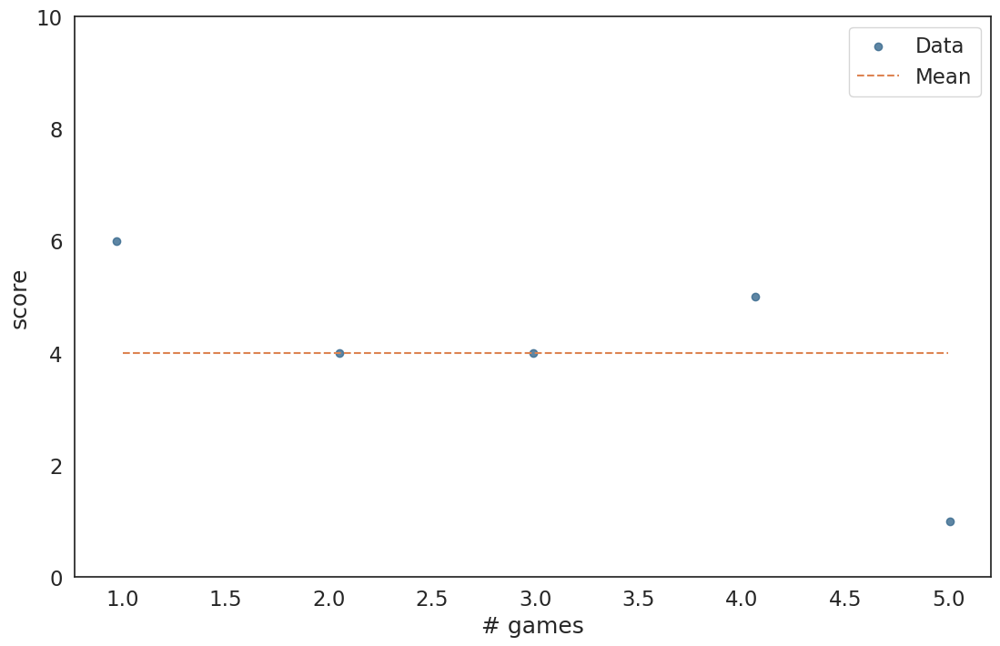

Total score: 20   Mean: 4   Std dev:   1.8708286933869707


(20, 4, 1.8708286933869707)

In [4]:
# Set options to activate or deactivate the game view, and its speed
pygame.font.init()
params = define_parameters()
params['bayesian_optimization'] = False    # Use bayesOpt.py for Bayesian Optimization
run(True, 50, params)

In [3]:
import os
from IPython.display import Video

# Define the path to the .avi video file
mp4_video_path = './snake-ga-tf/snake_trained.mp4'

if os.path.exists(mp4_video_path):
    display(Video(mp4_video_path, embed=True, width=960, height=540))